In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import os

import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import torch
from sklearn.manifold import TSNE

from ai4ha.data.series.ECGFeaturesDataset import ECGFeaturesDataset
from ai4ha.util.plot import smooth_plot

In [3]:
def last_samples(path):
    dirs = os.listdir(path)
    dirs = sorted([d for d in dirs if d.startswith("sampled_data")])
    return int(dirs[-1].split('.')[0].split('_')[-1])

---

In [4]:
from ai4ha.data.series.ECGDataset import ECGDataset
import pandas as pd

In [ ]:
padding = 24
paddingl = padding//2 #0


In [7]:
# orig = ECGDataset(dir="/home/bejar/bsc/Data/PTBXL",
#                   dataset='train',
#                   padding=padding,
#                   padalgo='mirror-s', sampling_smoothing_value=0,
#                   sampling_smoothing='inverse')

orig = ECGDataset(dir="/home/bejar/bsc/Data/PTBChap",
                  dataset='train',
                  padding=padding,
                  padalgo='mirror-s', sampling_smoothing_value=0,
                  sampling_smoothing='inverse')

# orig = ECGDataset(dir="/home/bejar/bsc/Data/chapman",
#                   dataset='train',
#                   padding=24,
#                   padalgo='zero')

Loading data from /home/bejar/bsc/Data/PTBChap
train
X_train shape is (51536, 12, 1024)
y_train shape is (51536,)
NClasses: 7 [0 1 2 3 4 5 6]
PAD=24 PADALGO=mirror-s NORM=False CHANNEL=12/None
Sampling smoothing Weights for classes: [ 3.8745959   2.61471334 19.44021124  8.09169414  8.2431222  18.86383602
 98.91746641]


In [ ]:
odata = [d[0].squeeze() for d in orig]
sdata = np.array(odata)#[:,:,paddingl:paddingl+length]
datal = np.array([int(d[1]) for d in orig])
length = sdata.shape[2]

In [9]:
model = 'ECG_PTBChap-zero-b128-M-UNET1C-s1024-l32-1248-r3-a2-te-positional-ce-embedding-6-DF-DDPM-t1000-b-4-2-ZSNR-linear-pt-sample-OPT-adamw-lr0.0001-SCcosine-w100-LS-L2'
path = f'/home/bejar/bsc/misiones/Series/Models/TimeDiffusion/logs/{model}/logs/losslog.csv'
loss = pd.read_csv(path)
loss.tail(3)

,loss (L2)
1815,0.960075
1816,0.950203
1817,0.894283


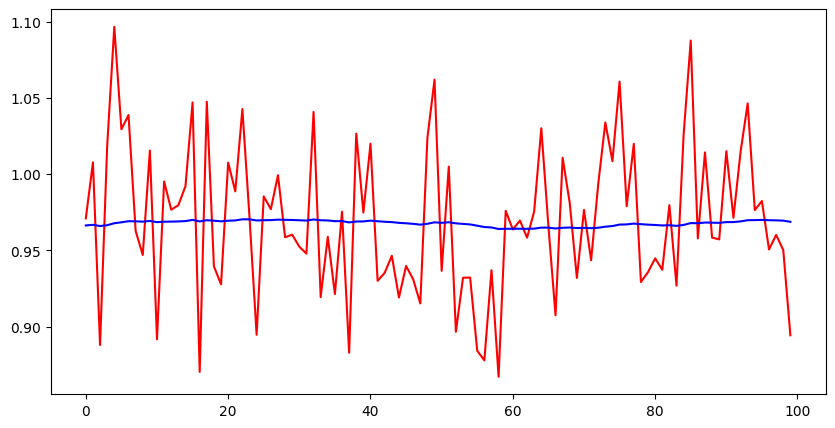

In [12]:
# loss.iloc[4:].plot(y=['MSEloss'])
smooth_plot(loss.iloc[:,0].values, 100, 0.99)

In [13]:
# # # Final samples
# samples = np.load(
#     f'/home/bejar/bsc/misiones/Series/Models/TimeDiffusion/logs/{model}/samples/sampled_data.npz'
# )
#Generated samples
sname = 11
samples = np.load(
    f'/home/bejar/bsc/misiones/Series/Models/TimeDiffusion/logs/{model}/samples/sampled_data_{model}_{sname}.npz'
)

samp = samples['samples']#[:,:,paddingl:paddingl+length]
lab = samples['classes']
sdata.shape, samp.shape


((51536, 12, 1024), (22528, 12, 1024))

In [ ]:
# samps = samp[lab != 7]
# labs = lab[lab != 7]
samps = samples['samples'][:, :, :length - padding]
labs = samples['classes']
np.savez_compressed(
    f'/home/bejar/bsc/misiones/Series/Models/TimeDiffusion/logs/{model}/samples/sampled_data_{model}_{sname}_s.npz',
    samples=samps,
    classes=labs)
samps.shape

array([[[-1.28117641e-02, -1.28117651e-02, -2.70511489e-02, ...,
          4.66977321e-02,  4.54530790e-02,  3.87888551e-02],
        [-1.03087589e-01, -1.03087589e-01, -9.70561504e-02, ...,
          6.87290076e-03,  1.29529489e-02,  9.09014326e-03],
        [-1.43457338e-01, -1.43457353e-01, -9.43486094e-02, ...,
         -4.62329984e-02, -2.15928406e-02, -8.34247749e-03],
        ...,
        [ 7.62493834e-02,  7.62493759e-02,  9.25838724e-02, ...,
          2.68420368e-01,  2.17320427e-01,  1.48199663e-01],
        [-9.80343595e-02, -9.80343670e-02, -7.80013129e-02, ...,
         -1.22230947e-01, -9.56239179e-02, -6.11472800e-02],
        [ 5.60540110e-02,  5.60540110e-02,  8.44311491e-02, ...,
          3.02736223e-01,  2.74014860e-01,  2.26261035e-01]],

       [[ 3.50906253e-02,  3.50906253e-02,  6.16504028e-02, ...,
          5.90710826e-02,  6.39074296e-02,  6.41565472e-02],
        [-7.38599896e-02, -7.38599896e-02, -6.57692626e-02, ...,
          5.34450337e-02,  1.29235268e

In [20]:
samps.shape

(22528, 12, 1000)

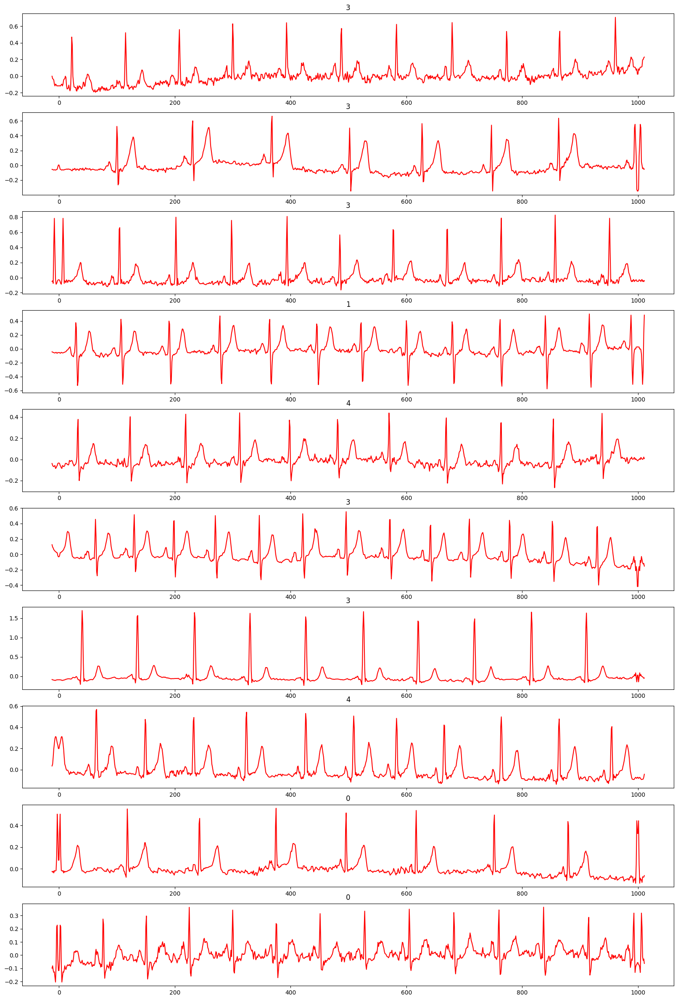

In [16]:
fig = plt.figure(figsize=(20, 30))
ch = 0
d = 0
for i in range(10):
    plt.subplot(10, 1, i + 1)
    plt.plot(range(-paddingl, length-paddingl),sdata[i + d][ch], c='r')
    plt.title(lab[i + d])

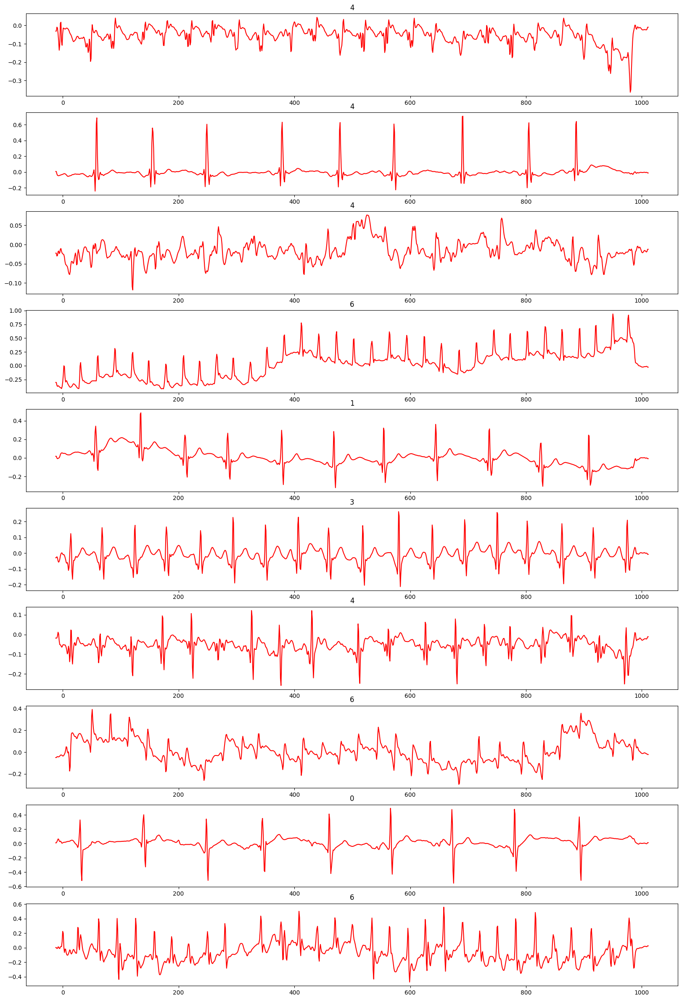

In [17]:
fig = plt.figure(figsize=(20, 30))
ch = 0
d = 40
for i in range(10):
    plt.subplot(10, 1, i + 1)
    plt.plot(range(-paddingl, length-paddingl), samp[i + d][ch], c='r')
    plt.title(lab[i + d])

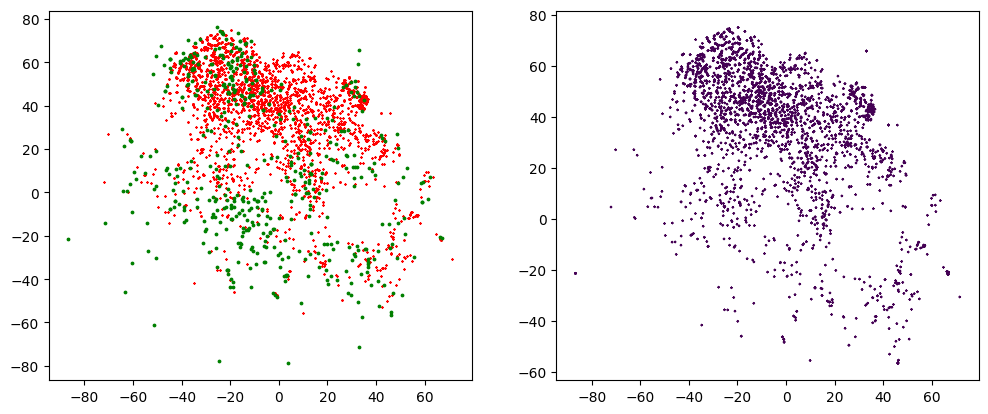

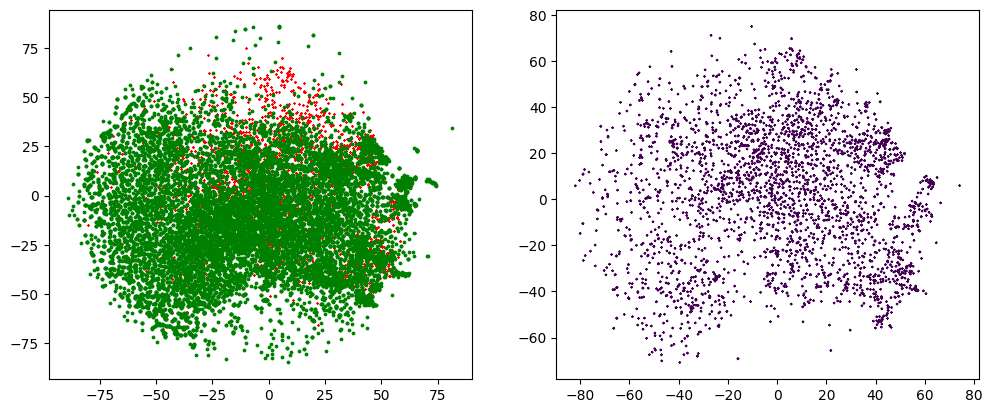

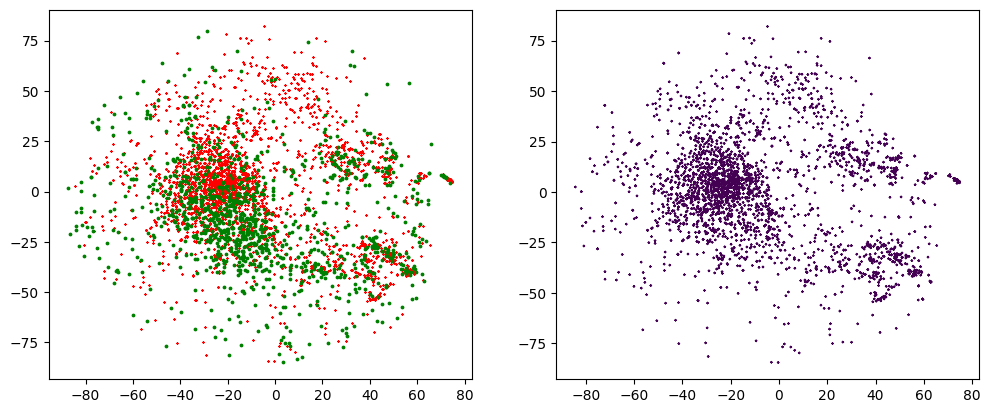

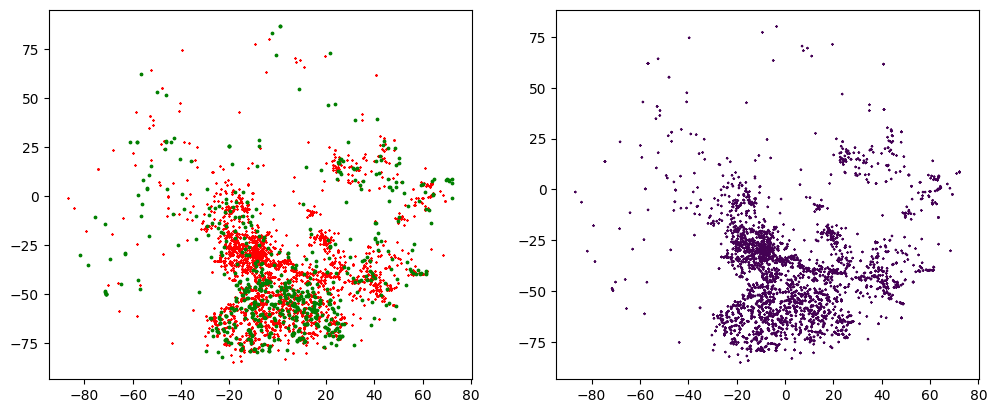

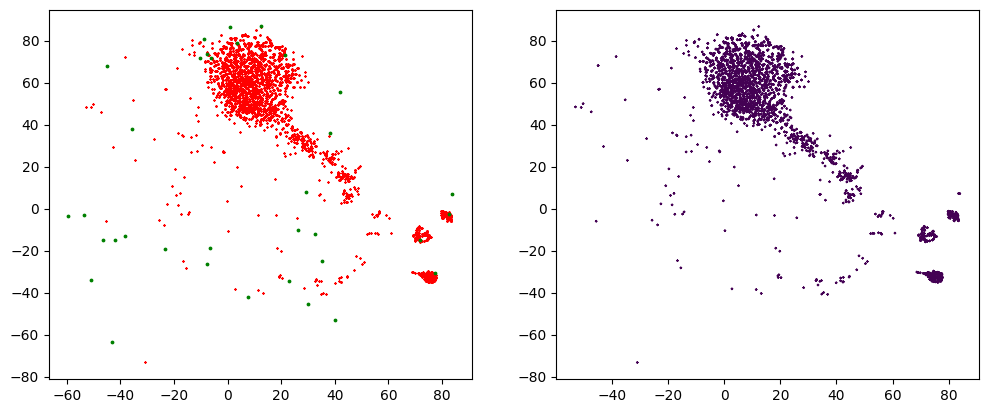

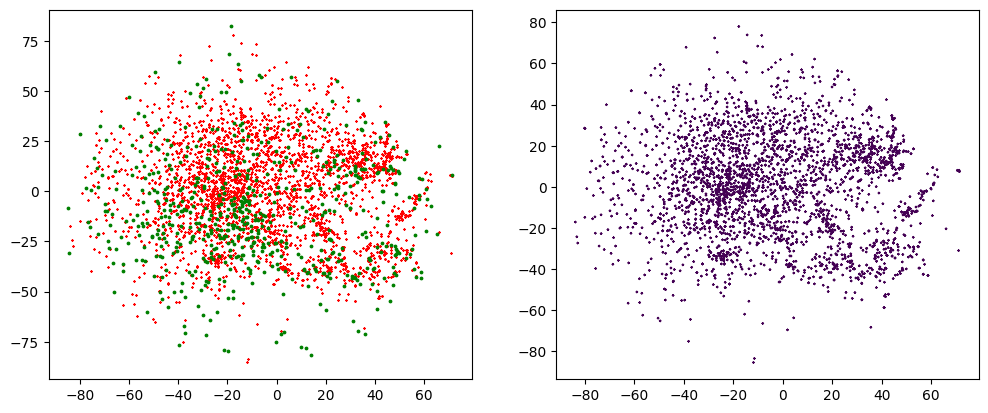

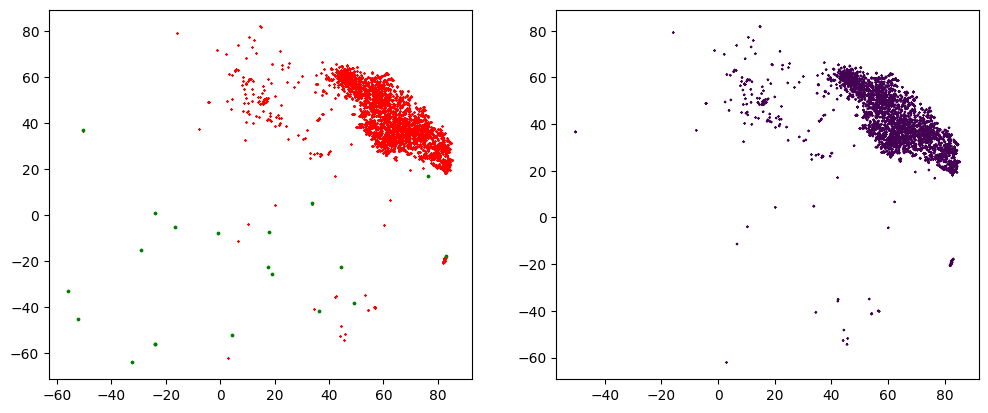

In [55]:

all = np.concatenate((samp.squeeze()[:, ch,:], sdata[:, ch, :]),
                     axis=0)
tsne = TSNE(n_components=2, perplexity=10, #max_iter=2000,
            init='random').fit_transform(all)
for lsel in range(7):
    fig = plt.figure()
    fig.set_figwidth(12)
    sp1 = fig.add_subplot(1, 2, 1)
    plt.scatter(tsne[:samp.shape[0], 0][lab == lsel],
                tsne[:samp.shape[0], 1][lab == lsel],
                c='r',
                s=1,
                marker='x')
    plt.scatter(tsne[samp.shape[0]:, 0][datal == lsel],
                tsne[samp.shape[0]:, 1][datal == lsel],
                c='g',
                s=3)


    sp1 = fig.add_subplot(1, 2, 2)
 
    plt.scatter(tsne[:samp.shape[0], 0][lab == lsel],
                tsne[:samp.shape[0], 1][lab == lsel],
                c=lab[lab == lsel],
                cmap='viridis',
                s=1,
                marker='x')
 

/home/bejar/env/t22/lib64/python3.10/site-packages/numpy/lib/function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/home/bejar/env/t22/lib64/python3.10/site-packages/numpy/lib/function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


(509, 12, 1280) (3243, 12, 1280)
(13404, 12, 1280) (3257, 12, 1280)
(1210, 12, 1280) (3284, 12, 1280)
(643, 12, 1280) (3151, 12, 1280)


/tmp/ipykernel_34084/4062165403.py:15: RuntimeWarning: invalid value encountered in divide
  corr /= sdatas.shape[0]


(34, 12, 1280) (3108, 12, 1280)
(613, 12, 1280) (3223, 12, 1280)


/tmp/ipykernel_34084/4062165403.py:15: RuntimeWarning: invalid value encountered in divide
  corr /= sdatas.shape[0]


(20, 12, 1280) (3262, 12, 1280)


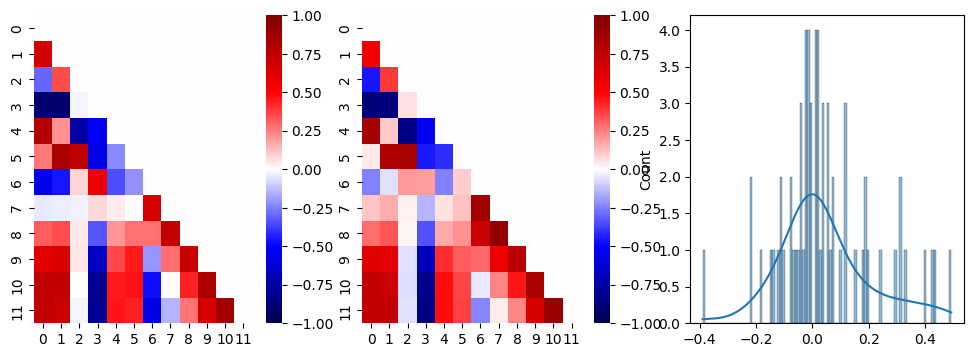

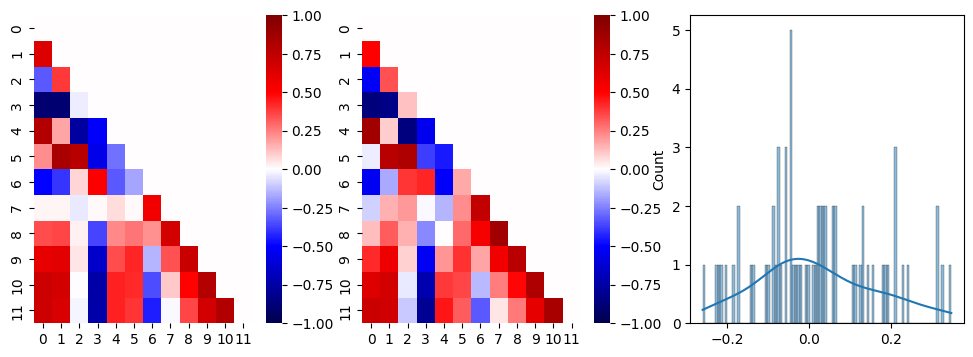

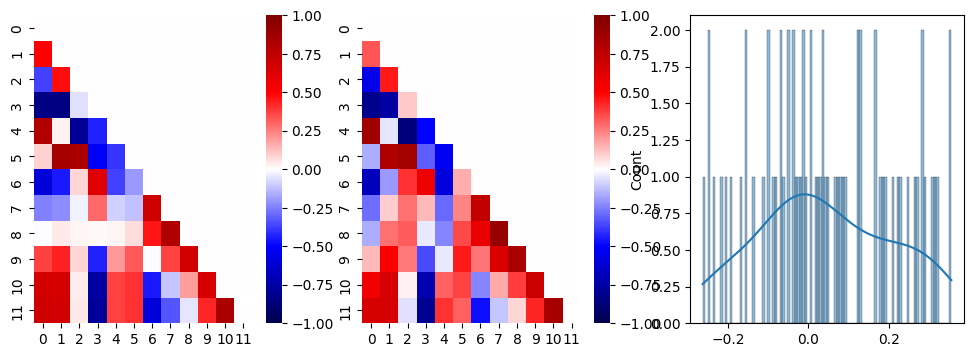

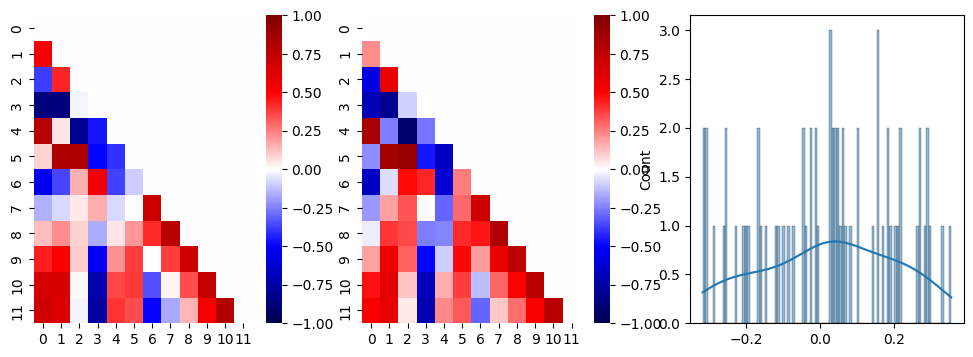

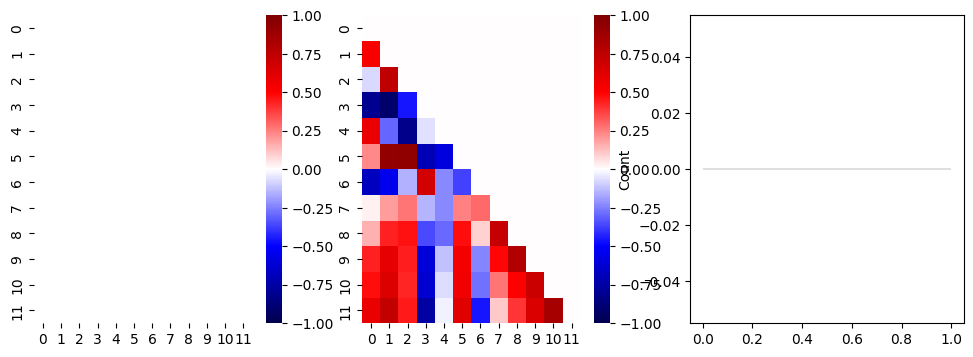

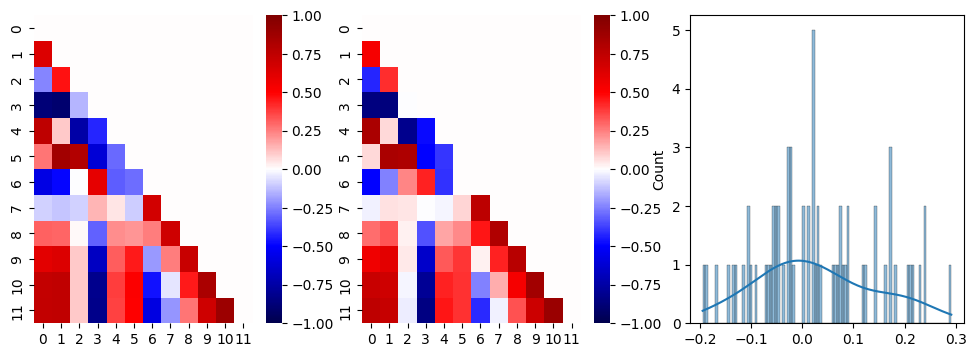

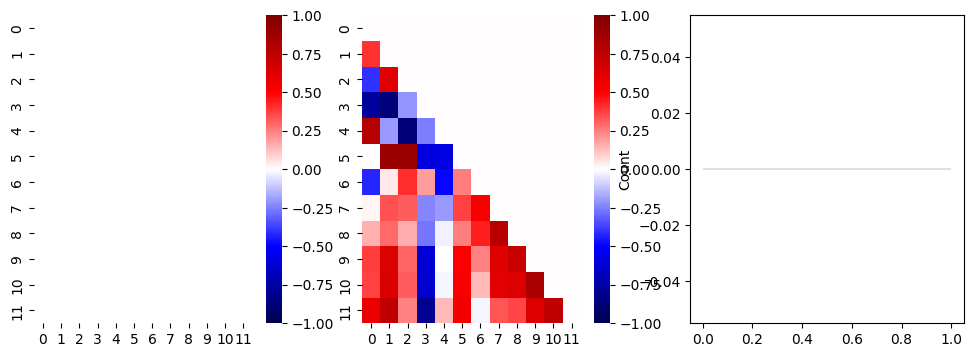

In [56]:
for lsel in range(7):
    sdatas = sdata[datal == lsel][paddingl:length - paddingl]

    corr = np.zeros((sdatas.shape[1], sdatas.shape[1]))

    for n in range(sdatas.shape[0]):
        for i in range(sdatas.shape[1]):
            for j in range(sdatas.shape[1]):
                if i > j:
                    cr = np.corrcoef(sdatas[n, i], sdatas[n, j])[0, 1]
                    if np.isnan(cr):
                        corr[i, j] += 0
                    else:
                        corr[i, j] += cr
    corr /= sdatas.shape[0]
    samps = samp[lab == lsel][paddingl:length - paddingl]

    corr2 = np.zeros((samps.shape[1], samps.shape[1]))
    for n in range(samps.shape[0]):
        for i in range(samps.shape[1]):
            for j in range(samps.shape[1]):
                if i > j:
                    corr2[i, j] += np.corrcoef(samps[n, i], samps[n, j])[0, 1]

    corr2 /= samps.shape[0]
    fig = plt.figure()
    fig.set_figheight(4)
    fig.set_figwidth(12)
    sp1 = fig.add_subplot(1, 3, 1)
    sns.heatmap(corr,
                cmap='seismic',
                annot=False,
                center=0,
                fmt='.2f',
                vmin=-1,
                vmax=1)
    sp1 = fig.add_subplot(1, 3, 2)
    sns.heatmap(corr2,
                cmap='seismic',
                annot=False,
                center=0,
                fmt='.2f',
                vmin=-1,
                vmax=1)
    lcorr = []
    for i in range(corr.shape[0]):
        for j in range(corr.shape[0]):
            if i > j:
                lcorr.append(corr2[i, j] - corr[i, j])
    sp1 = fig.add_subplot(1, 3, 3)
    sns.histplot(np.array(lcorr), bins=100, kde=True, ax=sp1)
    print(sdata[datal == lsel].shape, samp[lab == lsel].shape)

In [57]:
from numpy.fft import fft, ifft

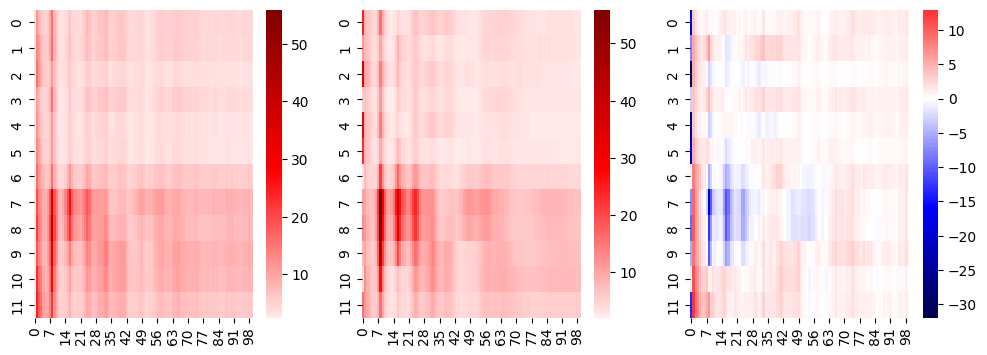

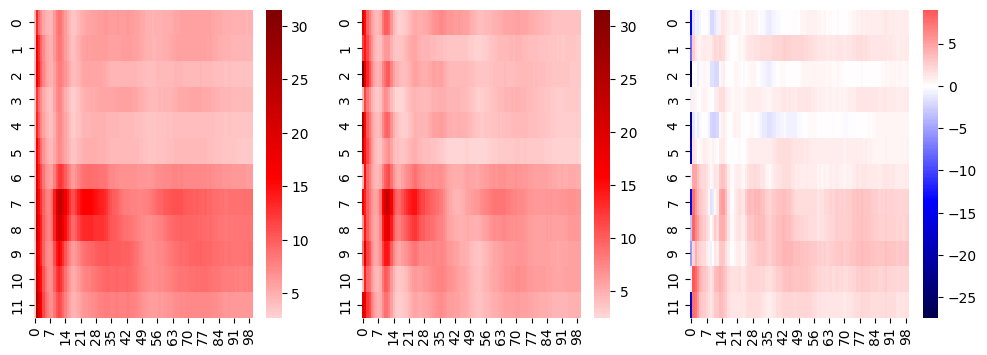

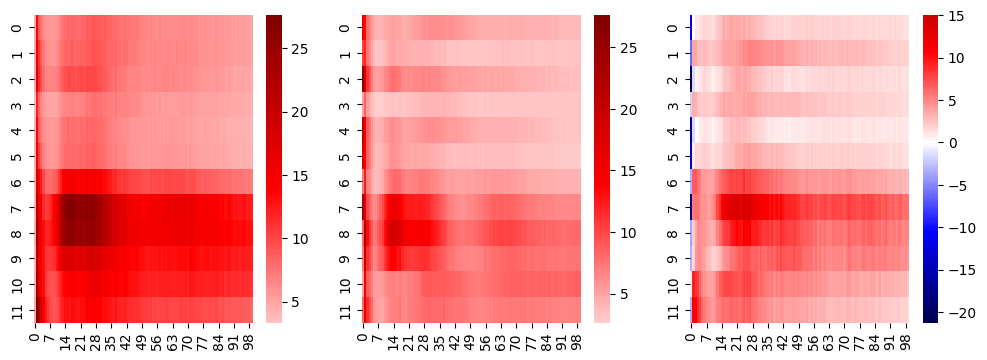

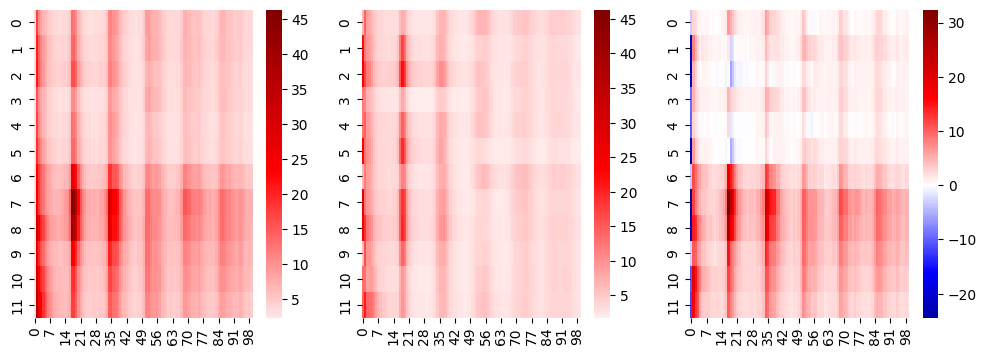

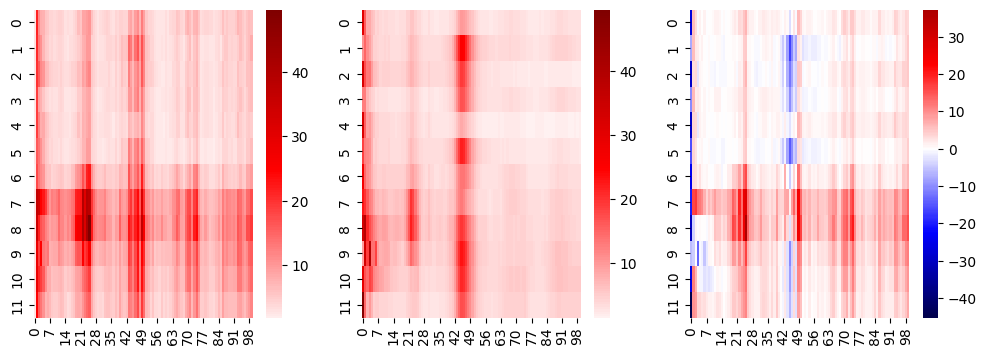

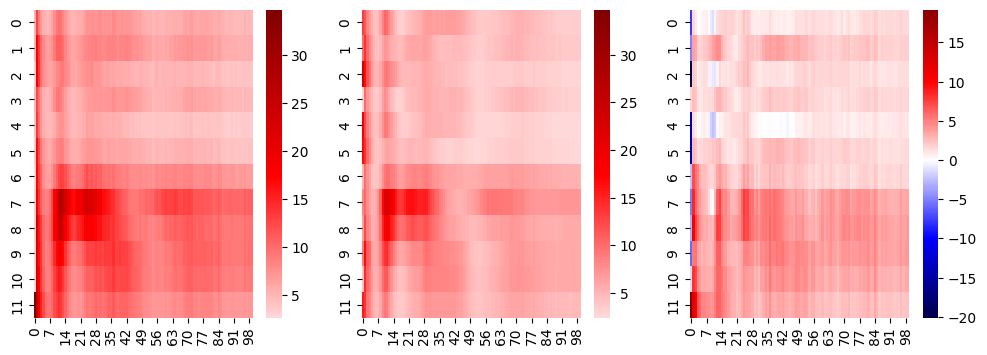

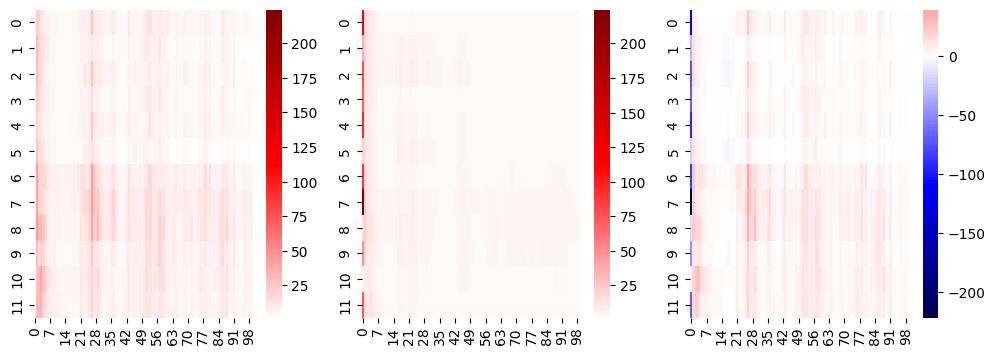

In [58]:
nfreq = 100
for lsel in range(7):
    sdatas = sdata[datal == lsel]

    mean_freq = np.zeros((sdatas.shape[1], nfreq))

    for n in range(sdatas.shape[0]):
        for i in range(sdatas.shape[1]):
            mean_freq[i] += np.abs(fft(sdatas[n, i][paddingl:length-paddingl])[:nfreq])

    mean_freq /= sdatas.shape[0]

    samps = samp[lab == lsel]

    mean_freq2 = np.zeros((samps.shape[1], nfreq))
    for n in range(samps.shape[0]):
        for i in range(samps.shape[1]):
            mean_freq2[i] += np.abs(fft(samps[n, i][paddingl:length-paddingl])[:nfreq])

    mean_freq2 /= samps.shape[0]

    fig = plt.figure()
    fig.set_figheight(4)
    fig.set_figwidth(12)
    sp1 = fig.add_subplot(1, 3, 1)
    vmax = np.max([np.max(mean_freq), np.max(mean_freq2)])
    sns.heatmap(mean_freq,
                cmap='seismic',
                annot=False,
                center=0,
                fmt='.2f',
                vmax=vmax)
    sp1 = fig.add_subplot(1, 3, 2)
    sns.heatmap(mean_freq2,
                cmap='seismic',
                annot=False,
                center=0,
                fmt='.2f',
                vmax=vmax)
    sp1 = fig.add_subplot(1, 3, 3)
    sns.heatmap(mean_freq-mean_freq2, cmap='seismic', annot=False, center=0) 

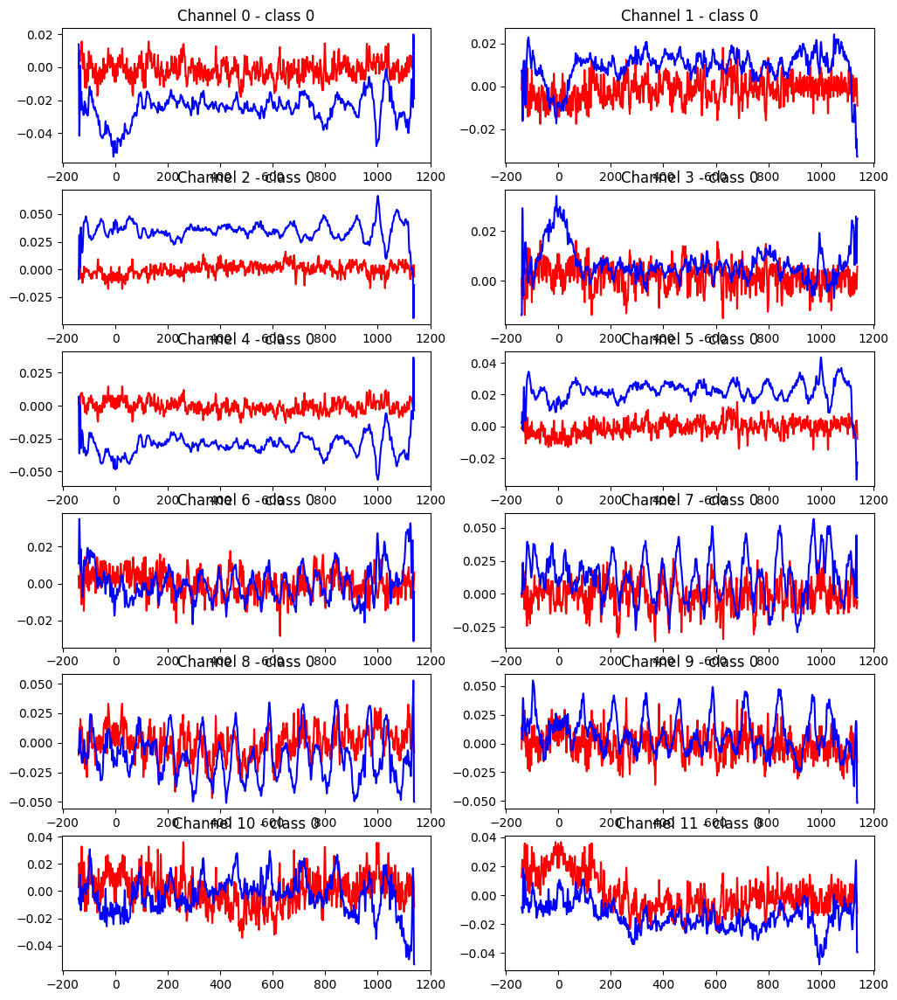

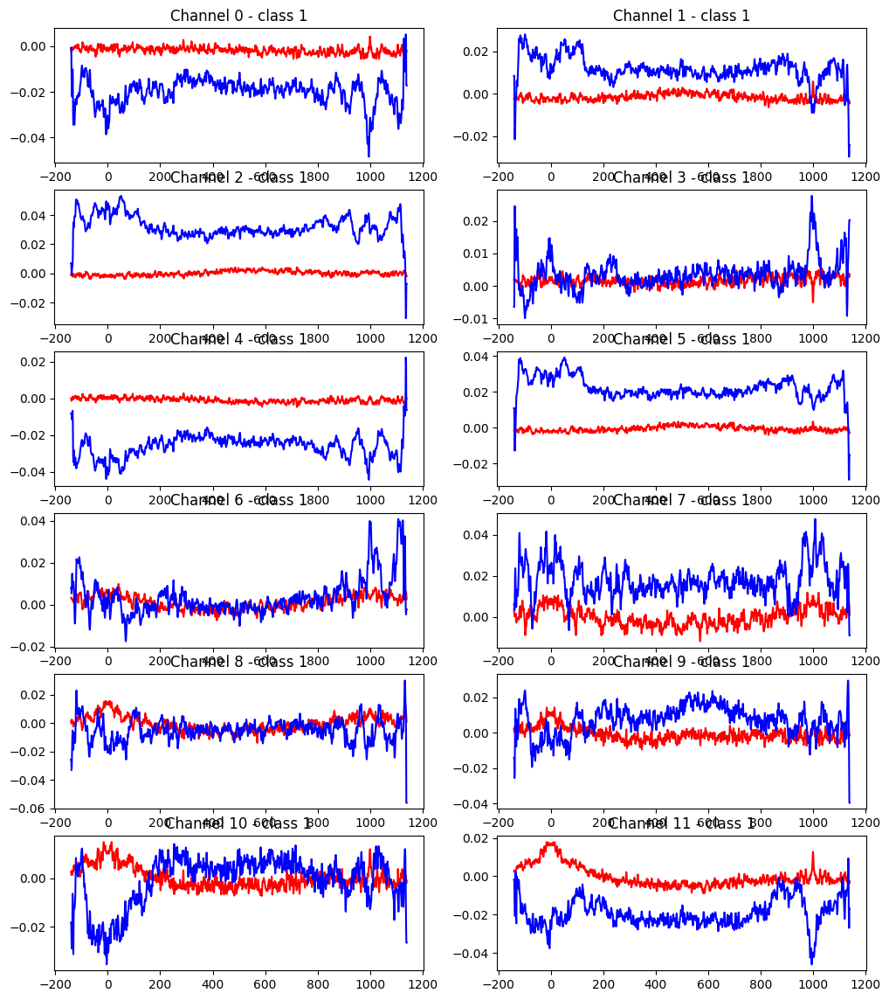

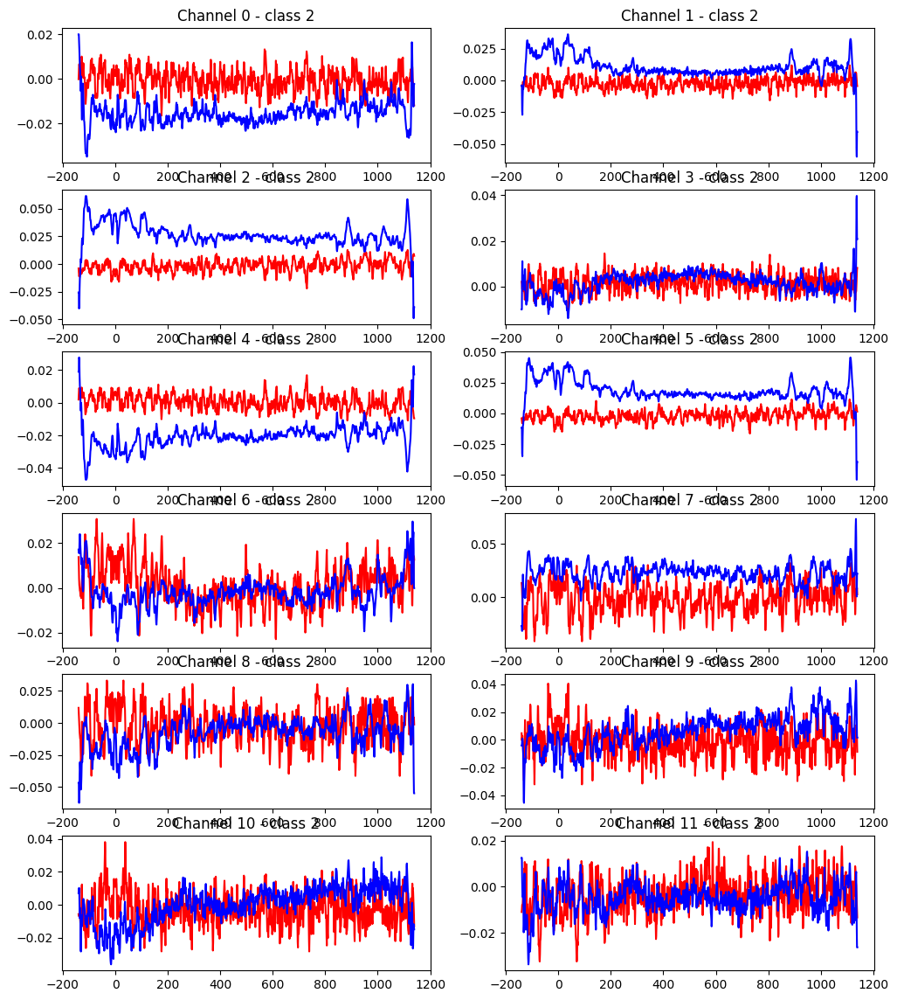

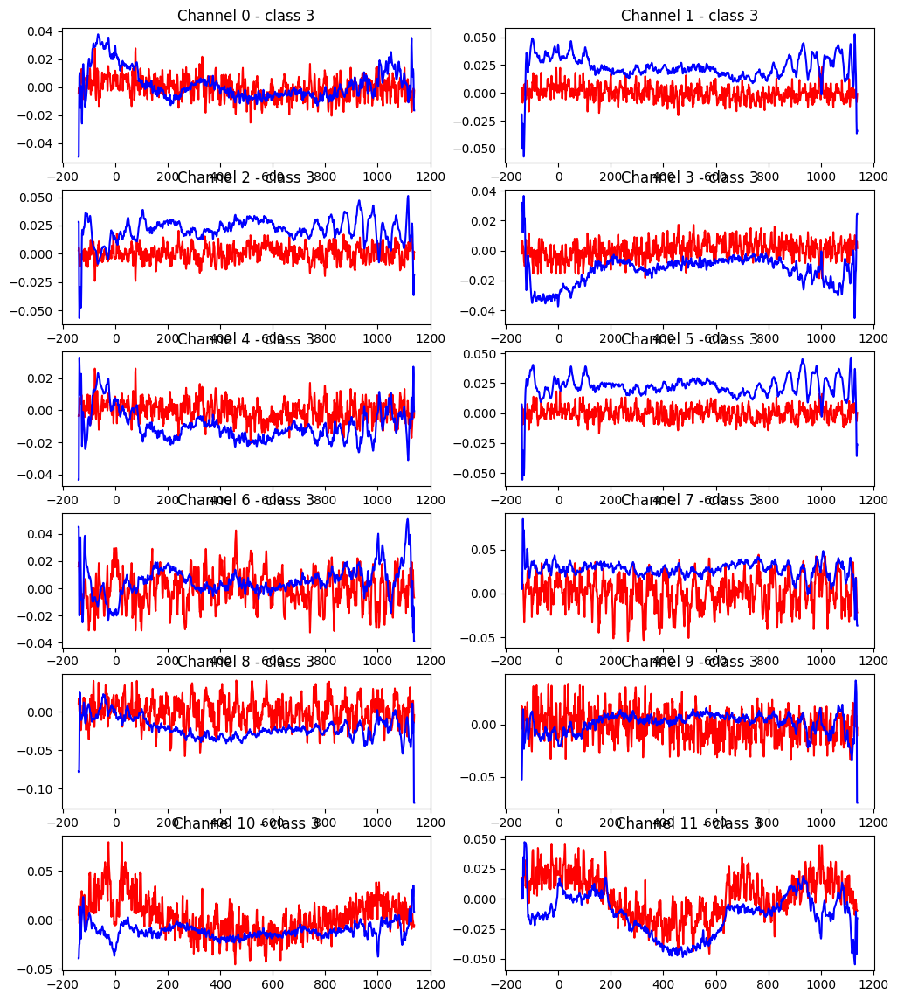

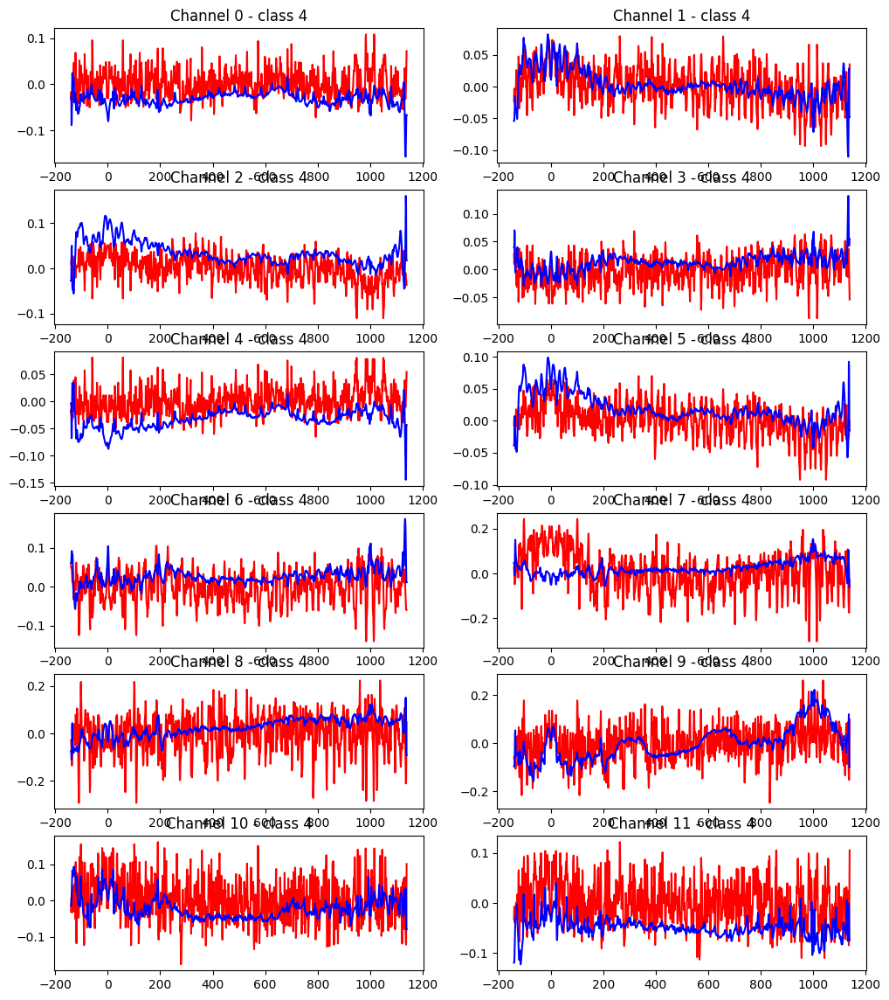

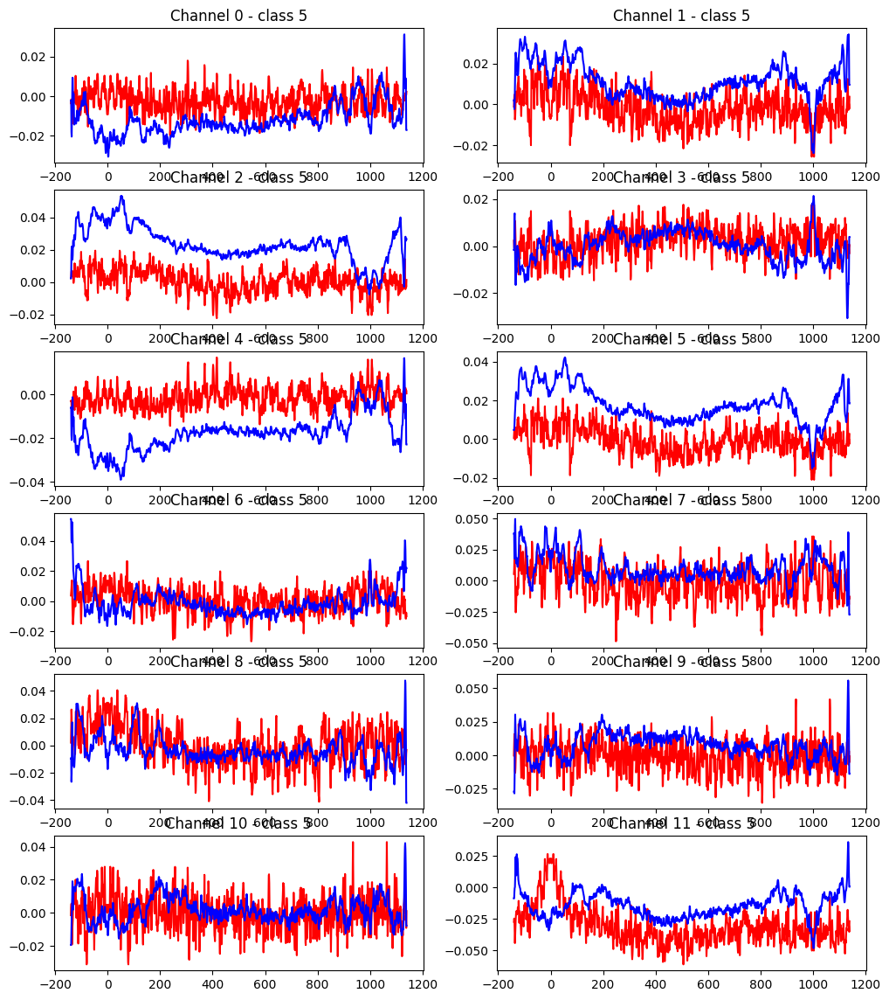

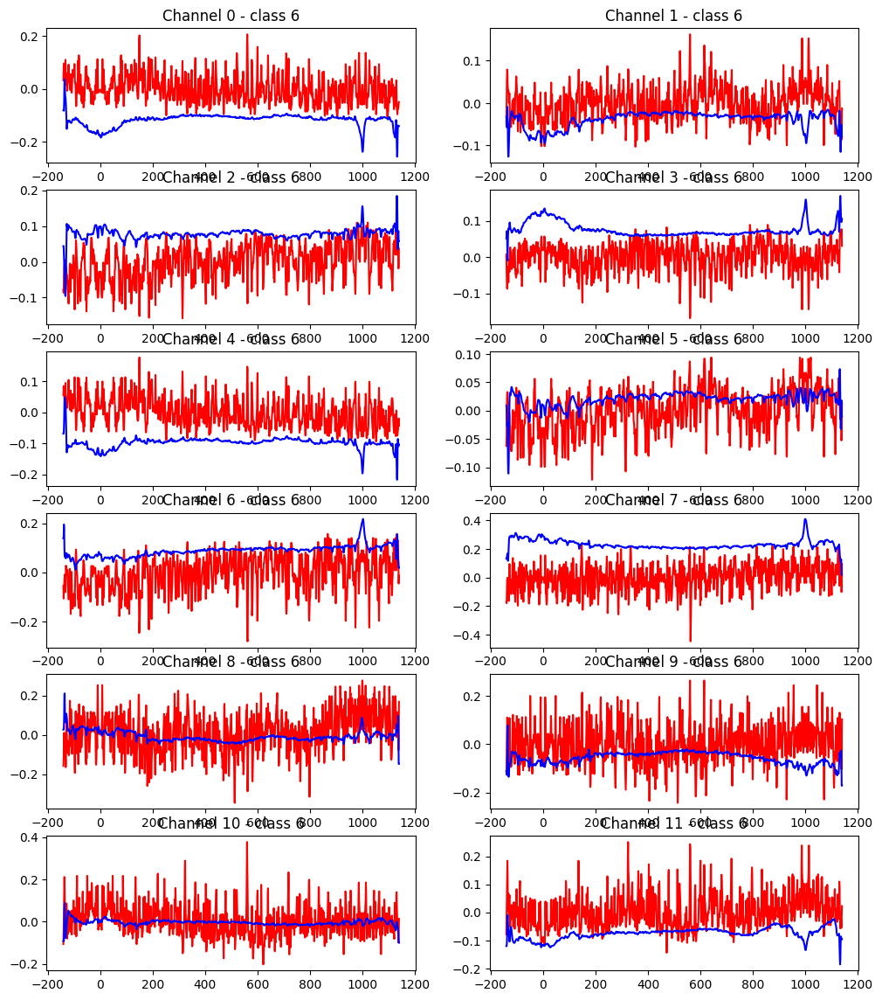

In [59]:
for lsel in range(7):
    fig = plt.figure()
    fig.set_figheight(14)
    fig.set_figwidth(12)
    for ch in range(12):
        sdatas = sdata[datal == lsel]

        min_r = np.min(sdatas[:, ch, :], axis=0)
        mean_r = np.mean(sdatas[:, ch, :], axis=0)
        max_r = np.max(sdatas[:, ch, :], axis=0)

        samps = samp[lab == lsel].squeeze()

        min_g = np.min(samps[:, ch, :], axis=0)
        max_g = np.max(samps[:, ch, :], axis=0)
        mean_g = np.mean(samps[:, ch, :], axis=0)

        sp1 = fig.add_subplot(6, 2, ch + 1)
        plt.title(f'Channel {ch} - class {lsel}')
        # plt.plot(min_r, c='r')
        # plt.plot(max_r, c='r')
        plt.plot(range(-paddingl, length-paddingl),mean_r, c='r')
        # plt.plot(min_g, c='b')
        # plt.plot(max_g, c='b')
        plt.plot(range(-paddingl, length-paddingl),mean_g, c='b')

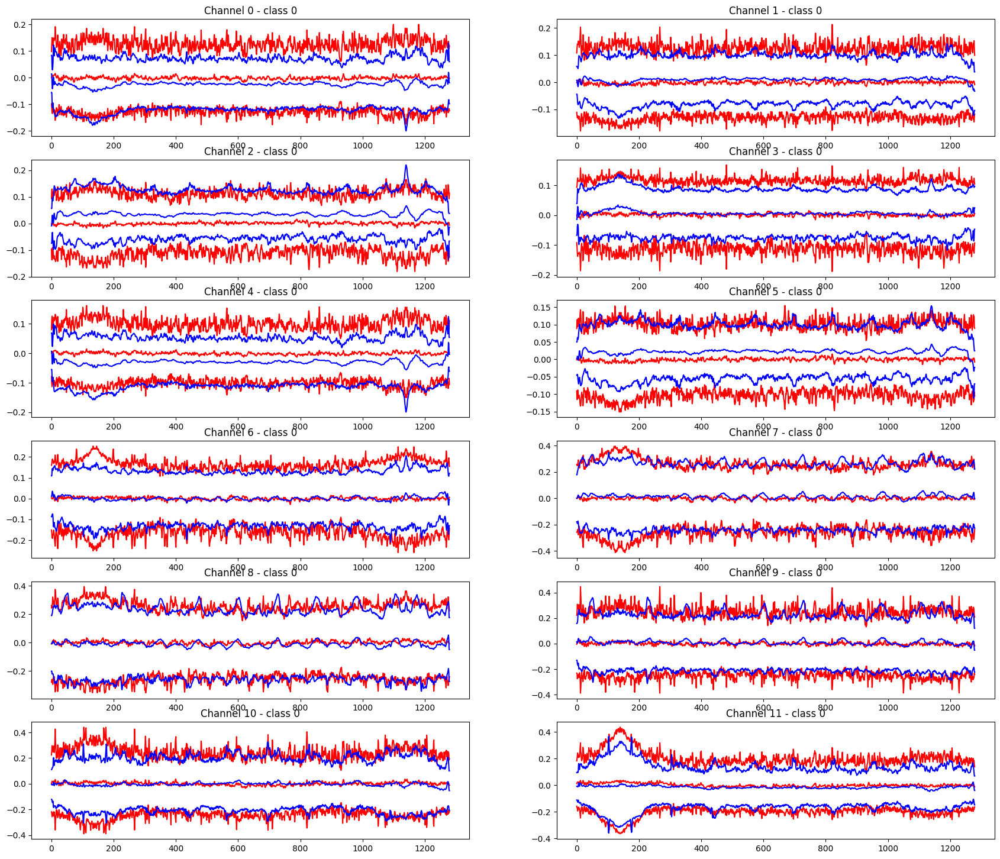

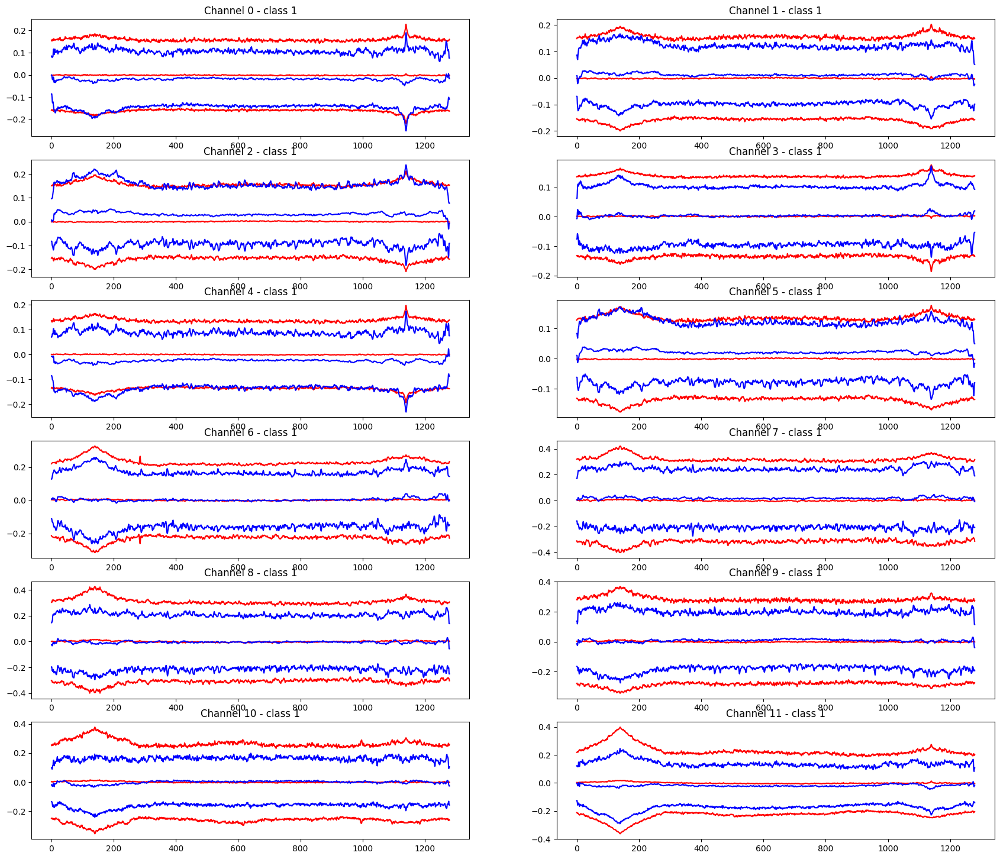

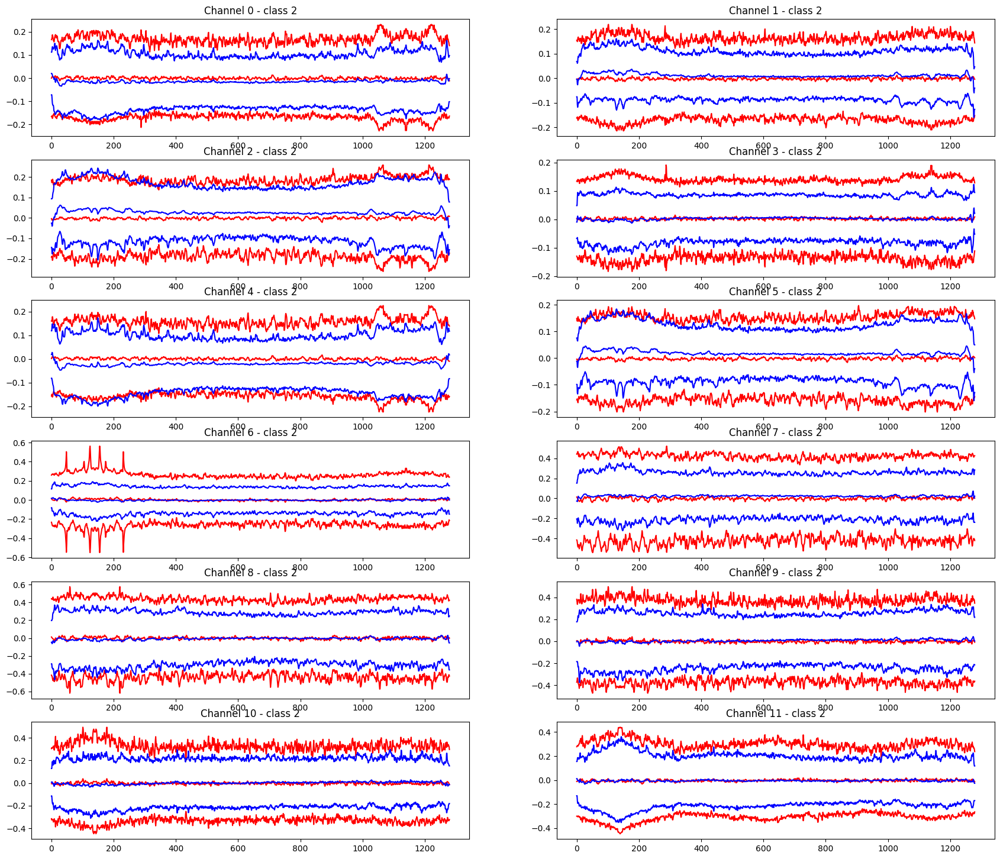

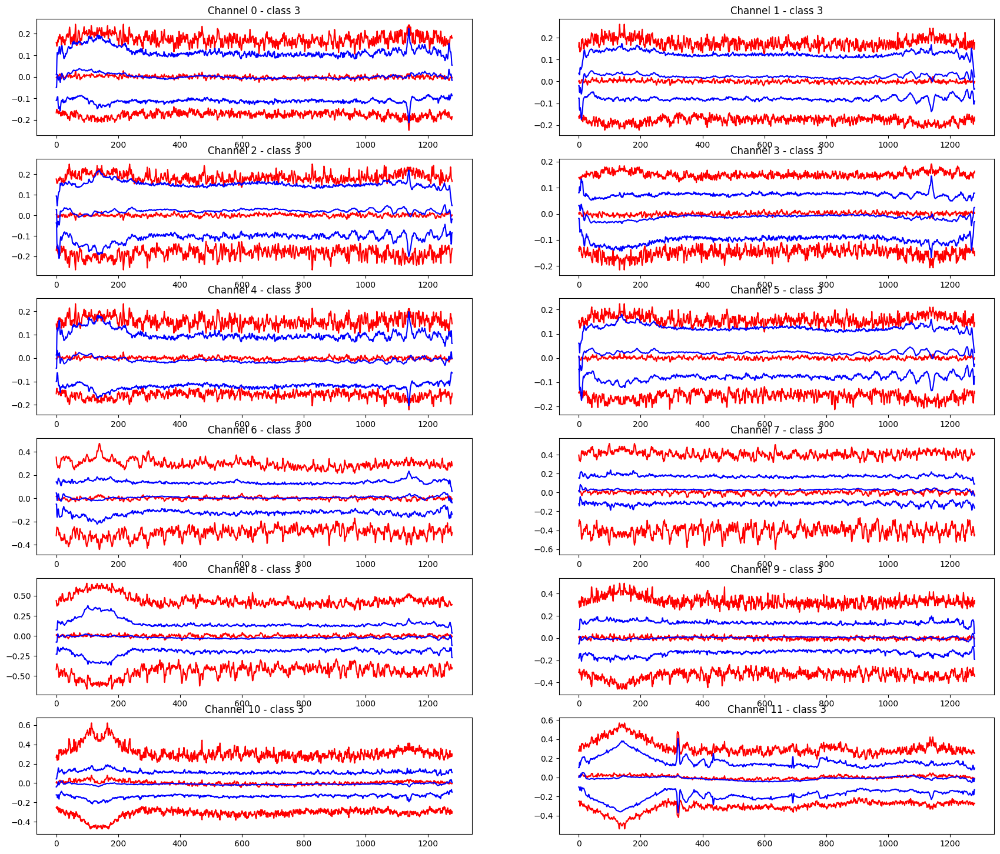

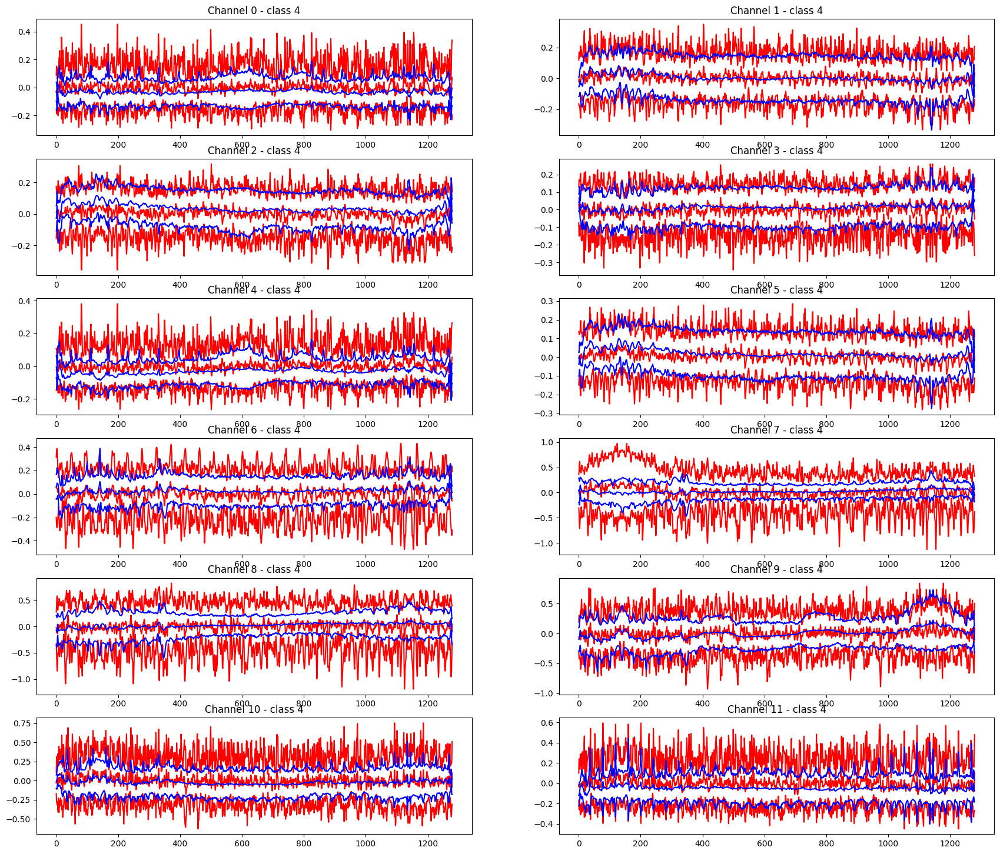

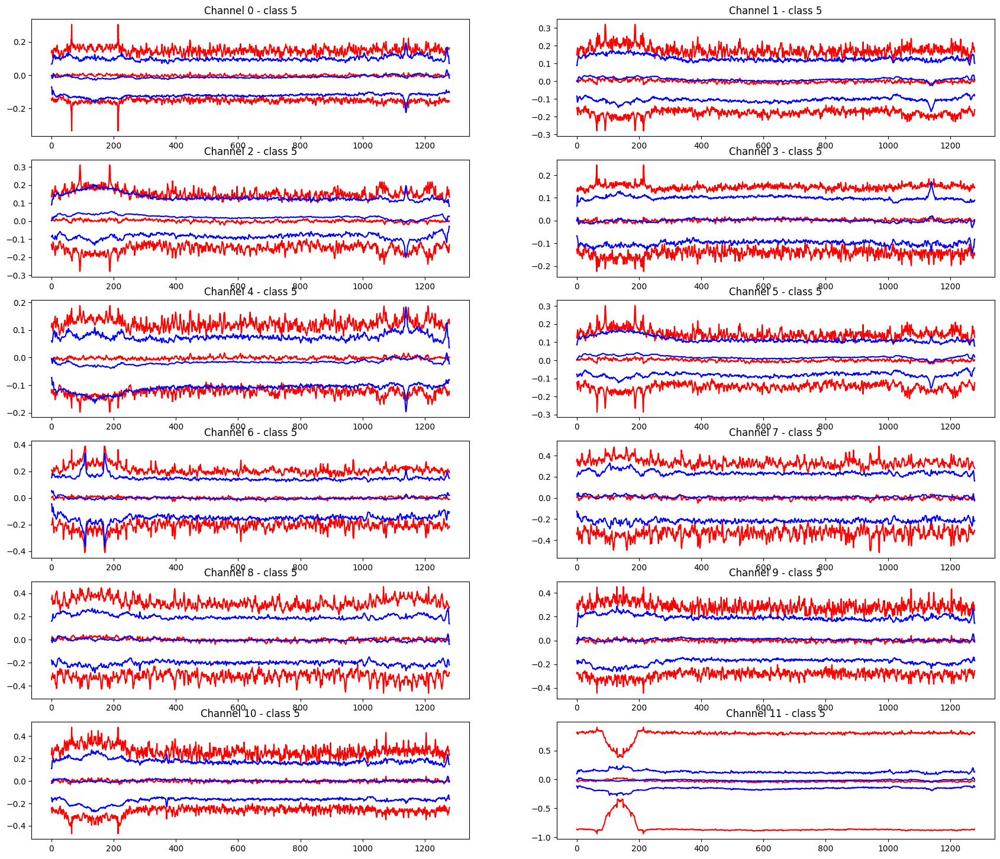

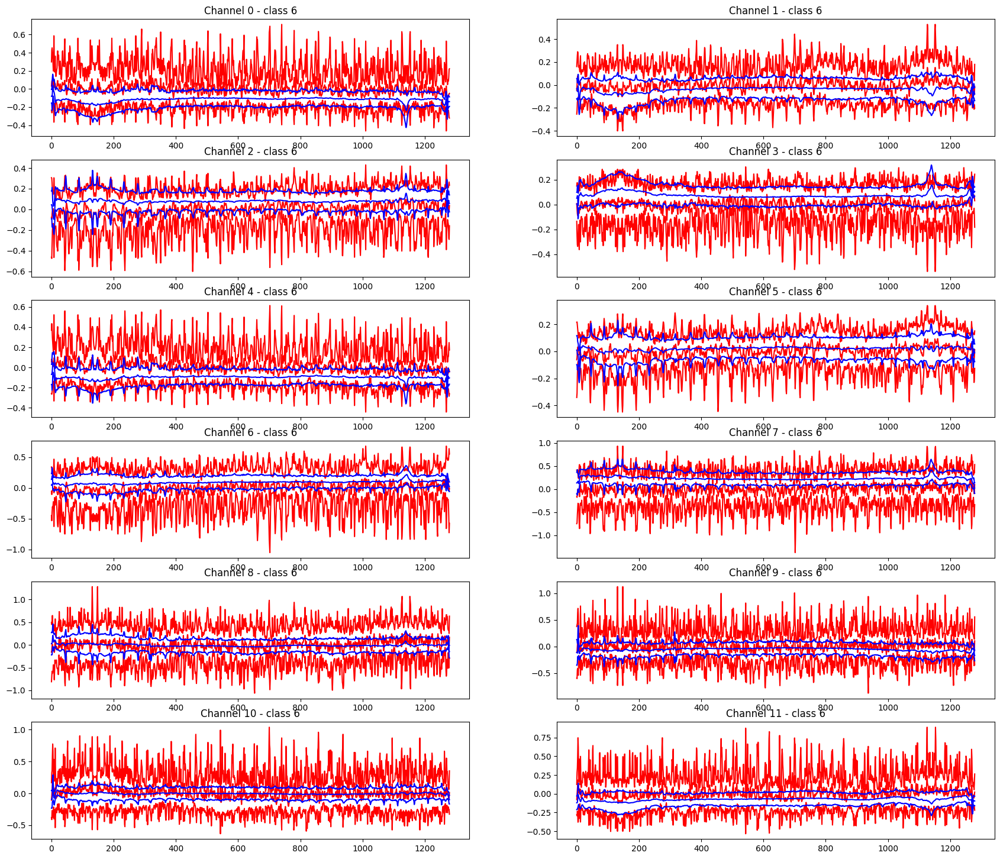

In [60]:
for lsel in range(7):
    fig = plt.figure()
    fig.set_figheight(18)
    fig.set_figwidth(21)
    for ch in range(12):
        sdatas = sdata[datal == lsel]

        std_r = np.std(sdatas[:, ch, :], axis=0)
        mean_r = np.mean(sdatas[:, ch, :], axis=0)


        samps = samp[lab == lsel].squeeze()

        std_g = np.std(samps[:, ch, :], axis=0)
        max_g = np.max(samps[:, ch, :], axis=0)
        mean_g = np.mean(samps[:, ch, :], axis=0)

        sp1 = fig.add_subplot(6, 2, ch + 1)
        plt.title(f'Channel {ch} - class {lsel}')
        plt.plot(mean_r + std_r, c='r')
        plt.plot(mean_r - std_r, c='r')
        plt.plot(mean_r, c='r')
        plt.plot(mean_g + std_g, c='b')
        plt.plot(mean_g - std_g, c='b')
        plt.plot(mean_g, c='b')

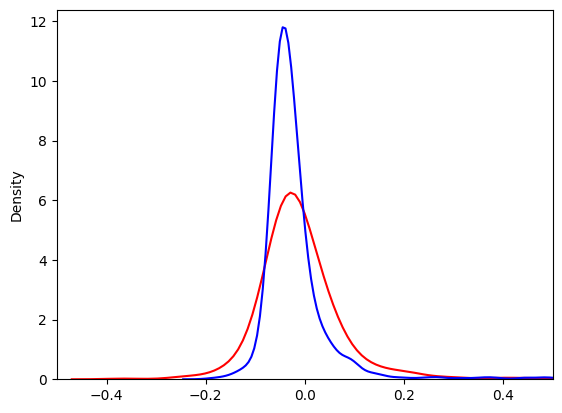

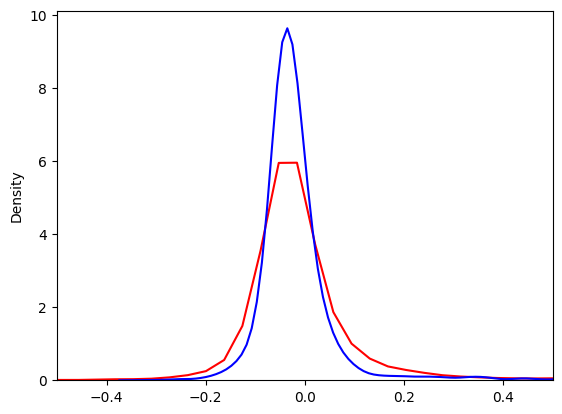

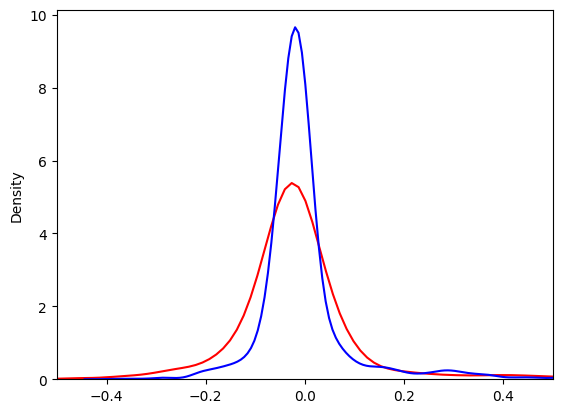

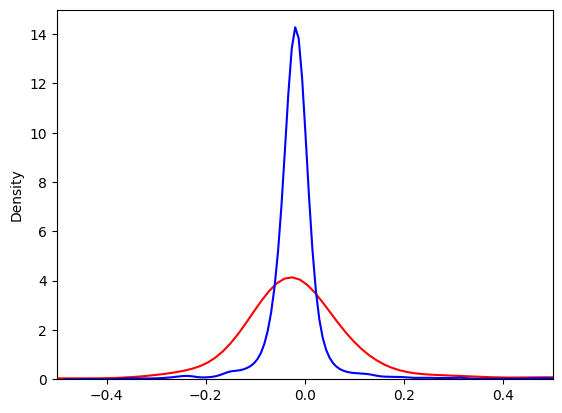

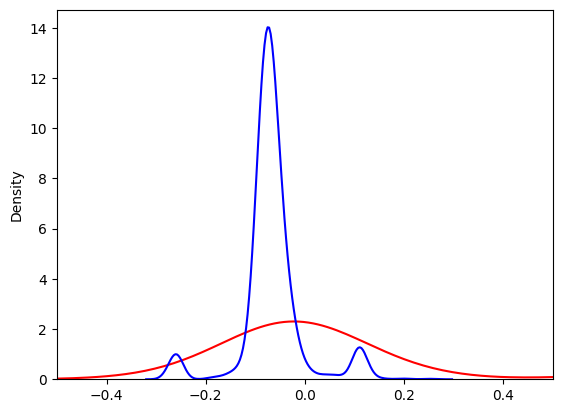

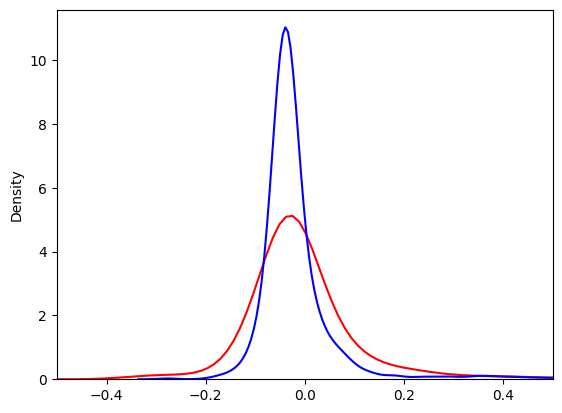

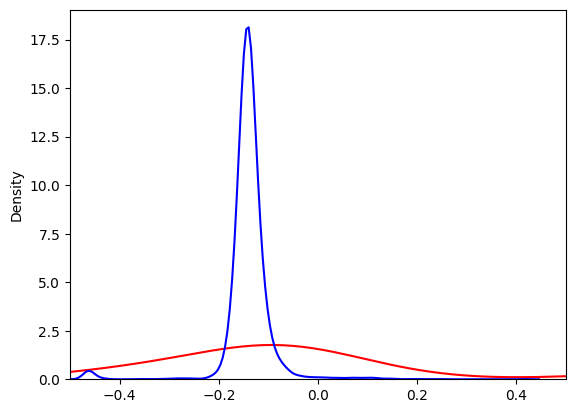

In [61]:
p=1
for lsel in range(7):
    sdatas = sdata[datal == lsel]
    samps = samp[lab == lsel].squeeze()
    ch = 0
    plt.figure()
    sns.kdeplot(sdatas[:, ch, -p], color='r')
    sns.kdeplot(samps[:, ch, -p], color='b')
    plt.xlim(-0.5, 0.5)